In [1]:
import os
import glob
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
from scipy.ndimage import gaussian_filter
import skimage as sk
from skimage.io import imread, imshow
from skimage import exposure

from matplotlib.patches import Polygon

import tifffile

from moire_class import FourierAnalyzer 
from tabulate import tabulate

# Analysis of defocused interferometric 4D STEM data (recorded 12.09.2023) #

In [1]:
## load the scale of the images calculated before ##
scale_df = pd.read_csv('20230912_files/scales.csv', index_col=0)

In [3]:
scale_df

,2048,4096
4x4,0.002014,0.001007
8x8,0.004028,0.002014
16x16,0.008057,0.004028
32x32,0.016114,0.008057
64x64,0.032228,0.016114
128x128,0.064456,0.032228
256x256,0.128911,0.064456
512x512,0.257823,0.128911
1024x1024,0.515645,0.257823
2048x2048,1.031290,0.515645


## find the angle of the Moiré in that region ##

In [4]:
def get_scale(file, scale_df):
    with tifffile.TiffFile(file) as tif:
        tif_tags = {}
        for tag in tif.pages[0].tags.values():
            name, value = tag.name, tag.value
            if name=='ImageDescription':
                tif_tags[name] = value
    image = tif.pages[0].asarray()
    pre_scale=float(tif_tags['ImageDescription'].split(',')[1].split(':')[-1])
    pre_scale = int(len(image)*pre_scale)

    scale = scale_df.loc[ f'{int(pre_scale)}x{int(pre_scale)}',str(len(image))]
    return scale

/home/clara/miniconda3/envs/mt_analysis/lib/python3.9/site-packages/tifffile/tifffile.py:8904: UserWarning: <tifffile.TiffPage 0 @8> reading array from closed file
  warnings.warn(


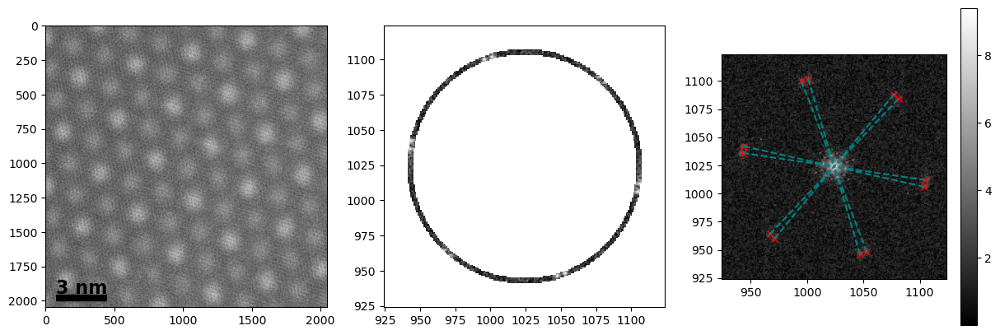

In [24]:
moire_files = glob.glob('/media/clara/PortableSSD/pnm/master_thesis/20230912_1751/moire_images/pos01_t20-10/*.tif')

# choose 16x16 fov image #
moire_file = moire_files[4]

# parameters : 'mask_radius' : (79, 84), 'neighborhood_size' : 6, 'threshold' : 3

scale = get_scale(moire_file, scale_df)
o = FourierAnalyzer(moire_file, scale)
o.find_angles()

The mean angle in this region is 4.2°


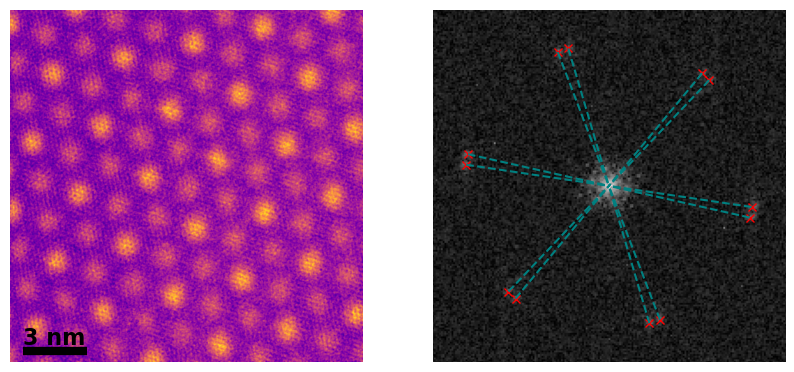

In [6]:
o.show_results(save=False, gaussian=3) #'20230912_files/pos01/'
angles = o.angles
angle = np.mean(o.angles)

print(f"The mean angle in this region is {round(np.degrees(np.mean(angles)), 1)}°");

In [7]:
print(np.degrees(np.mean(o.angles)) , ' +/- ' , np.degrees(np.std(o.angles)))

4.204036153549568  +/-  0.2289722789608955


## 4D STEM analysis ##

In [10]:
import interferometric
from interferometric import DataAnalyzer, Disk, DP, save_DataAnalyzer_object, load_DataAnalyzer_object, InterferometricAnalyzer
from tqdm import tqdm
import h5py
from dask import array
import json
import helper_functions as hf
import py4DSTEM

In [11]:
from dask.distributed import Client

client = Client()  # set up local cluster on your laptop

client

/home/clara/miniconda3/envs/mt_analysis/lib/python3.9/site-packages/distributed/node.py:182: UserWarning: Port 8787 is already in use.
Perhaps you already have a cluster running?
Hosting the HTTP server on port 35333 instead
  warnings.warn(


Connection method: Cluster object,Cluster type: distributed.LocalCluster
Dashboard: http://127.0.0.1:35333/status,
Dashboard: http://127.0.0.1:35333/status,Workers: 4
Total threads: 8,Total memory: 15.32 GiB
Status: running,Using processes: True
Comm: tcp://127.0.0.1:36229,Workers: 4
Dashboard: http://127.0.0.1:35333/status,Total threads: 8
Started: Just now,Total memory: 15.32 GiB
Comm: tcp://127.0.0.1:43809,Total threads: 2
Dashboard: http://127.0.0.1:40667/status,Memory: 3.83 GiB
Nanny: tcp://127.0.0.1:43219,


In [12]:
#path to the recorded datasets
path = '/media/clara/PortableSSD/pnm/master_thesis/20230912_1751/interferometric_datasets'

In [13]:
#find all datasets
files = glob.glob(path+'/*.h5')

In [14]:
# to check the files and find the right one #
for f in files:
    x = h5py.File(f)

    data = array.from_array(x["data"])
    metadata = json.loads(x['data'].attrs['properties'])
    print(metadata['data_modified']) #2h offset 

2023-09-12T18:45:50.959997
2023-09-12T19:16:08.724235
2023-09-12T21:39:17.435828
2023-09-12T19:59:21.819099


In [25]:
## select the dataset and referece STEM-MAADF image ##
file = files[0]
real_image_path = moire_files[1] #take 8x8 reference image

## initialize object

In [20]:
# initialize object #
pos01 = DataAnalyzer(file, energy=60, image_path=real_image_path, verbose=True)

In [36]:
pos01.image_scale = scale_df.loc['8x8','2048']
pos01.twist_angle = angle

In [27]:
# get identifier #
uuid = pos01.metadata['uuid']

## pre-processing

In [28]:
# calculate the dp mean #
pos01.calculate_mean()

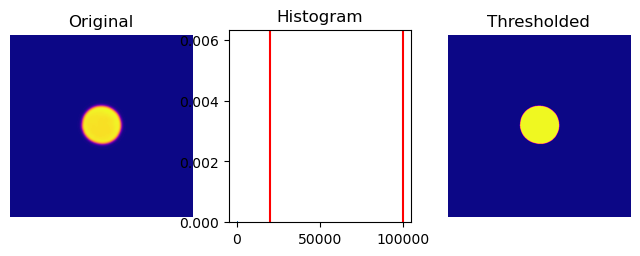

In [29]:
# get the disk radius and the centre of the pattern
pos01.disk_r, pos01.center = pos01.get_convergence_angle();

100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1200/1200 [04:39<00:00,  4.29it/s]


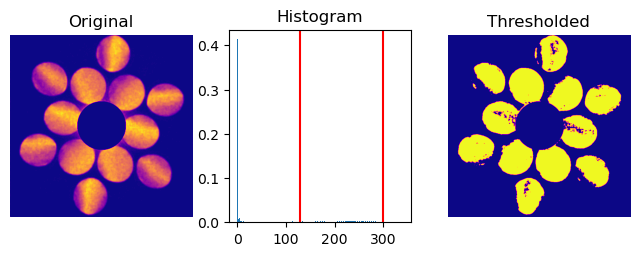

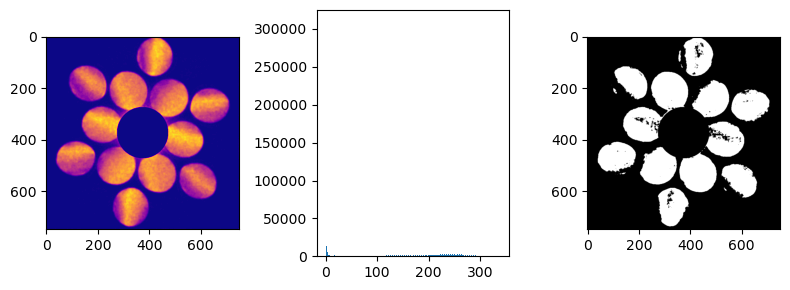

In [31]:
## create first disk estimate ##
summed, bin_image = pos01.create_binary_image_from_stack(line=12, first_thresholds=(8,60), second_thresholds=(130,300))#70

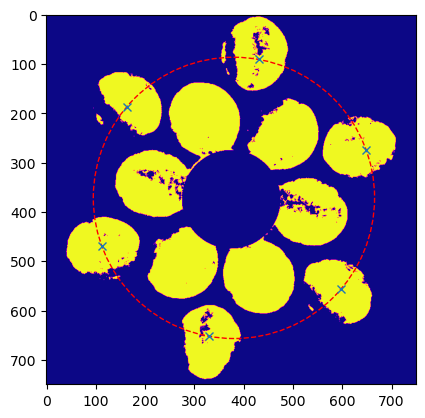

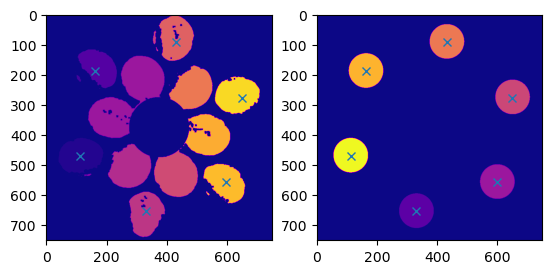

In [32]:
pos01.get_label_image(bin_image)

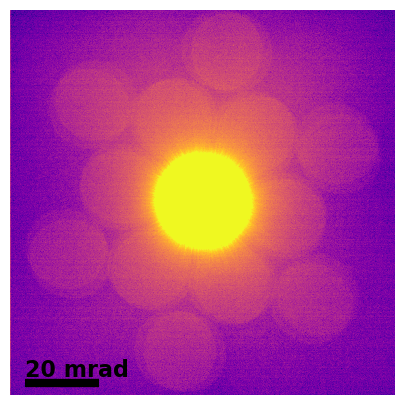

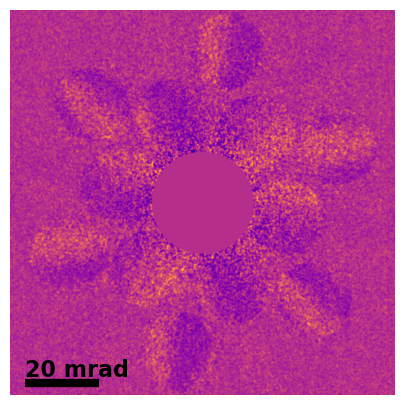

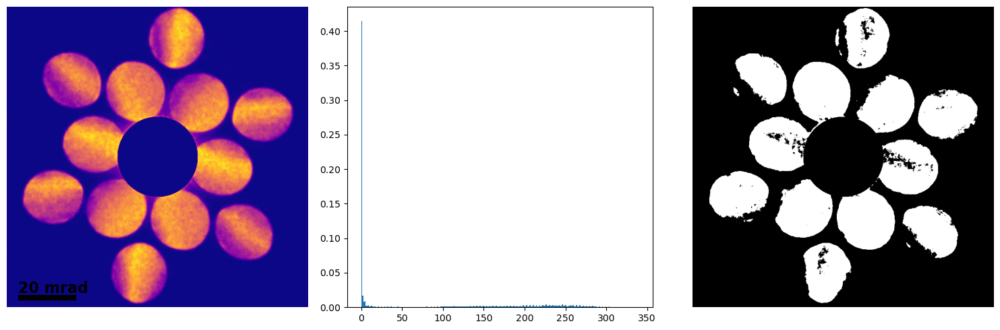

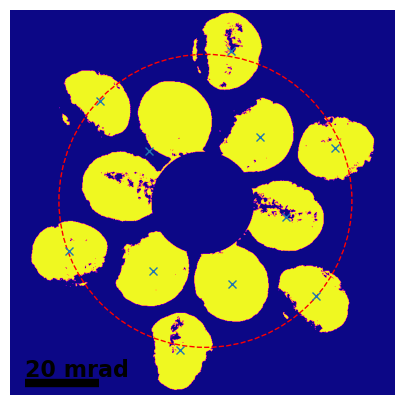

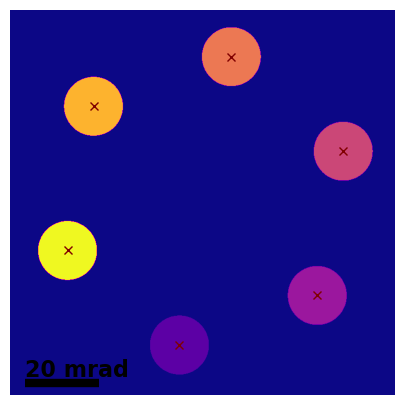

In [58]:
pos01.visualize_all(save='20230912_files/pos02-final/pre-processing')

## reconstruct the ADF image ##

In [55]:
pos01.reconstruct_adf('maadf') 

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 10000/10000 [09:32<00:00, 17.48it/s]


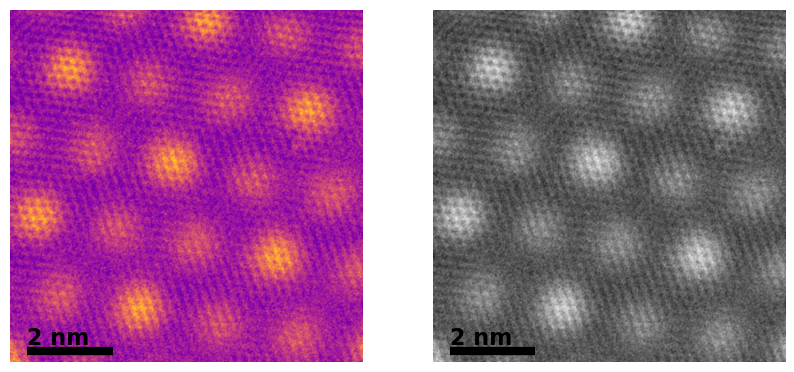

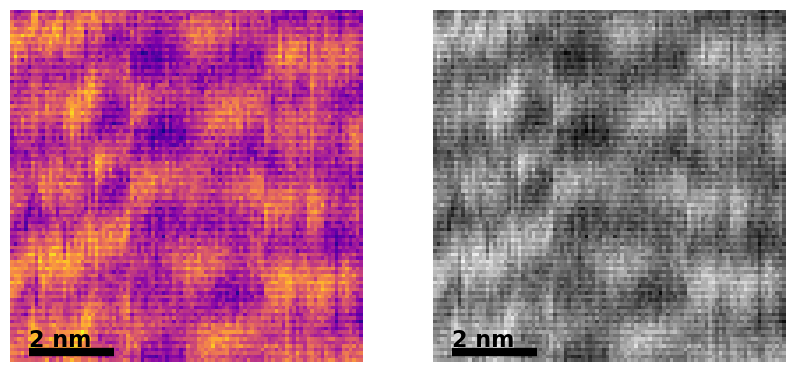

In [62]:
pos01.show_images(gaussian=3, save='20230912_files/pos02-final/pre-processing')

## set initial fit parameters

In [40]:
ps = []

## define initial parameters for disk 0##

A = 1
phi = 1.5
nu = .01
dir_ang = np.radians(-45)

p0_0 = (A, phi, nu, dir_ang)

ps.append(p0_0)

## define initial parameters for disk 1 ##

A = 1
phi = 1.5
nu = .01
dir_ang = np.radians(45)

p0_1 = (A, phi, nu, dir_ang)

ps.append(p0_1)


## define initial parameters for disk 2 ##

A = 1
phi = 6.3
nu = .01
dir_ang = np.radians(90)

p0_2 = (A, phi, nu, dir_ang)

ps.append(p0_2)

## example fit position

In [101]:
pos01.disk_mask = 10
pos01.verbose=False

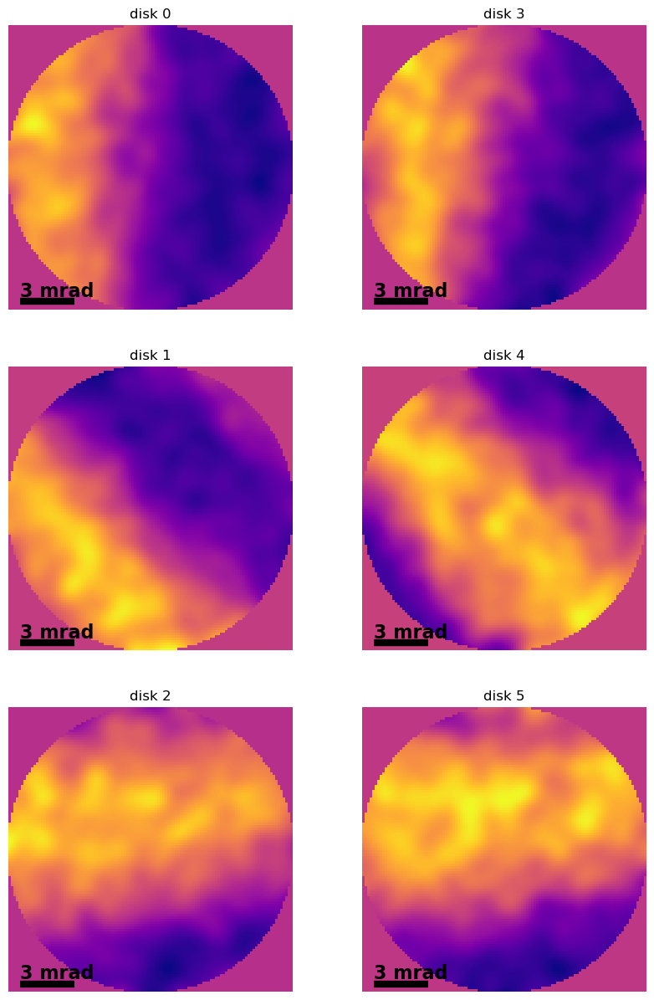

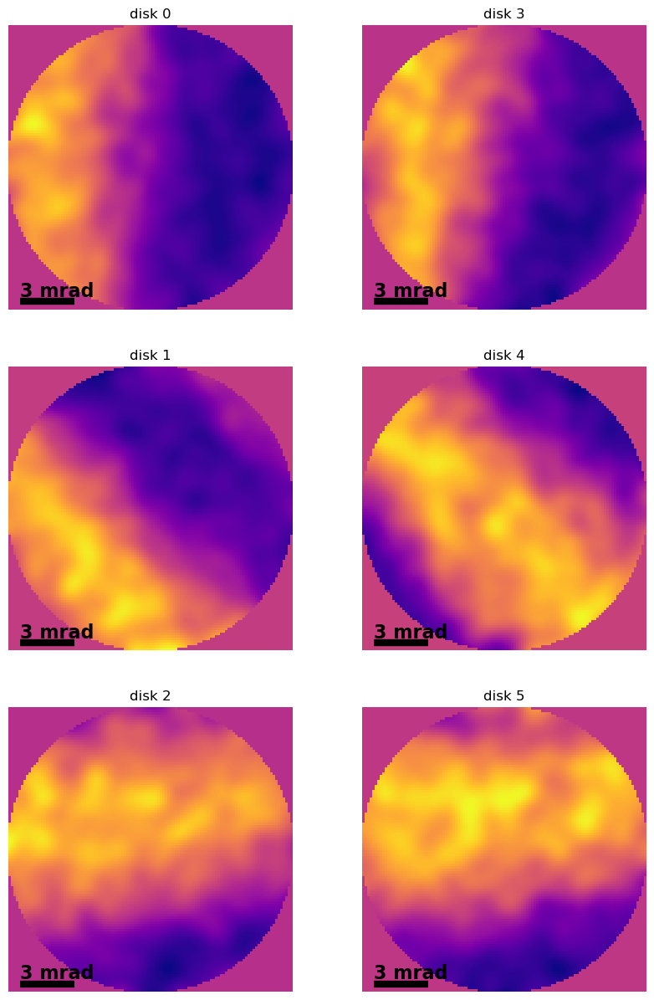

====== disk 0 ======
------ try 1 ------


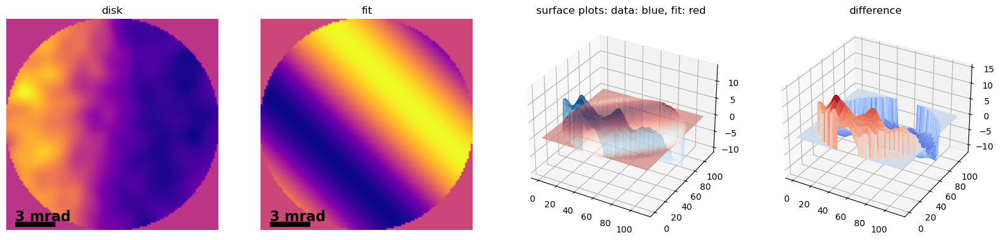

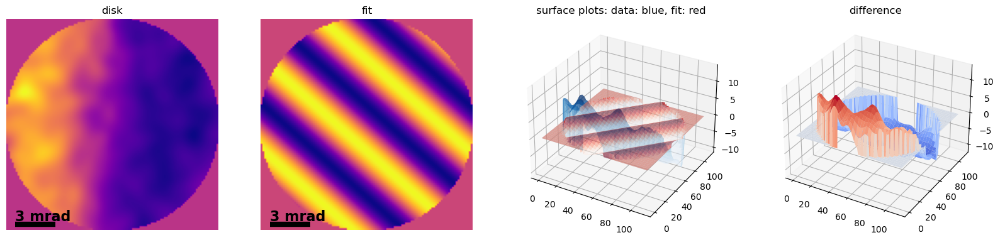

-0.06352785729823851
------ try 2 ------


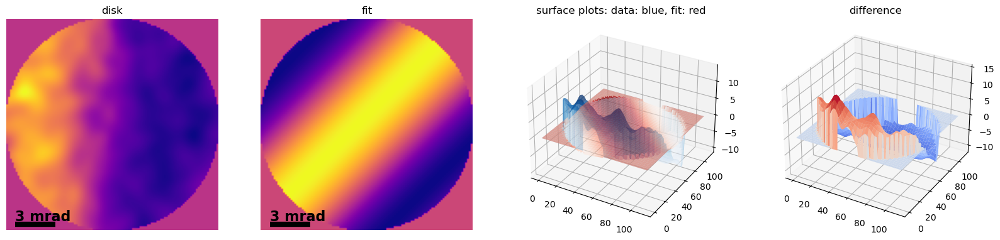

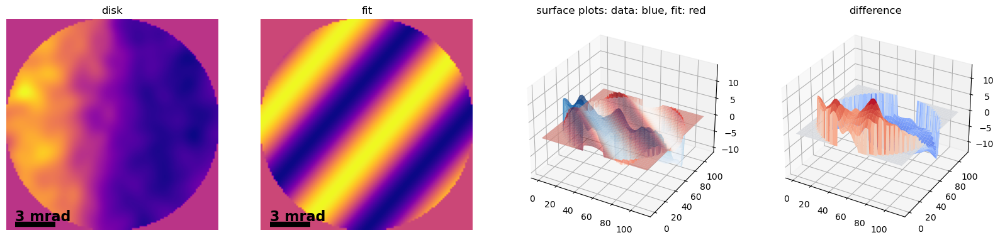

-0.03296067893320376
------ try 3 ------


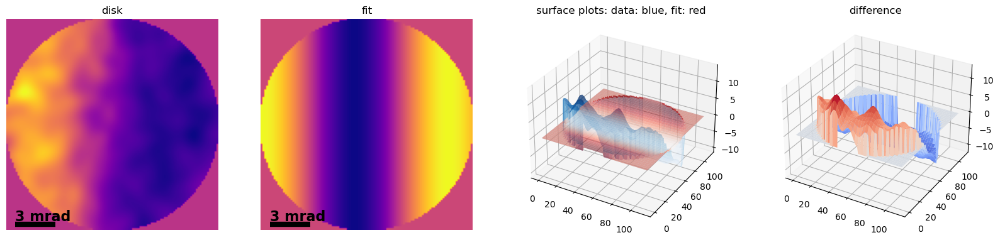

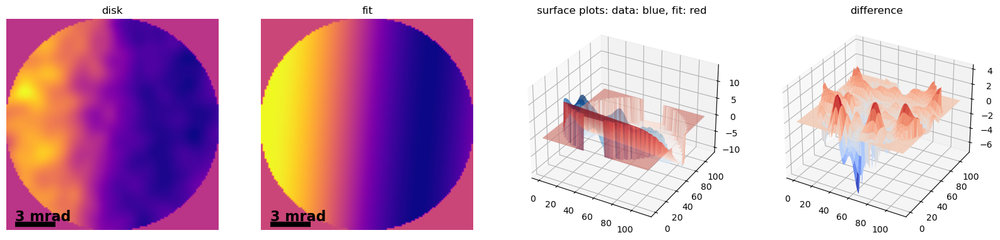

0.9692913748142422
====== disk 1 ======
------ try 1 ------


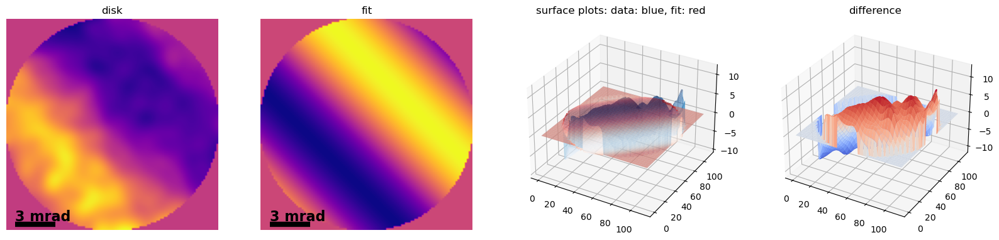

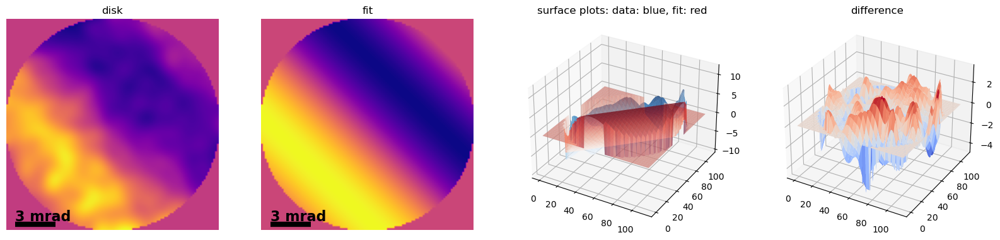

0.9642908850619685
====== disk 2 ======
------ try 1 ------


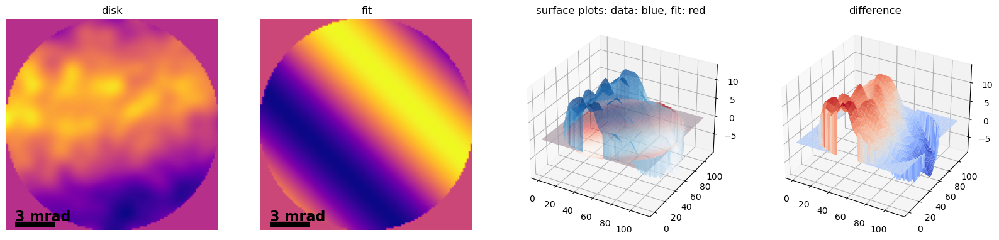

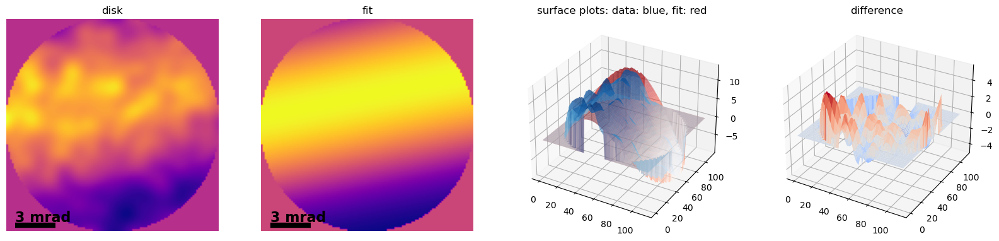

0.9352730781987211
====== disk 3 ======
------ try 1 ------


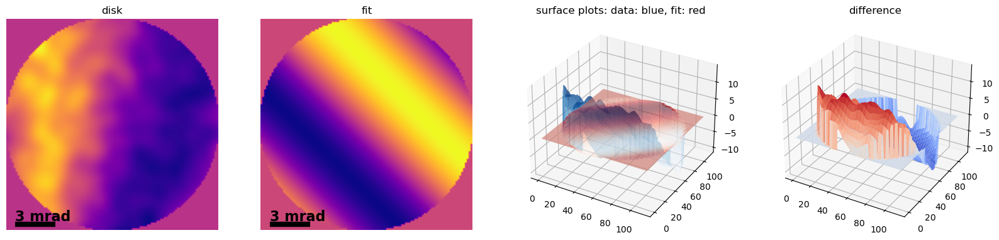

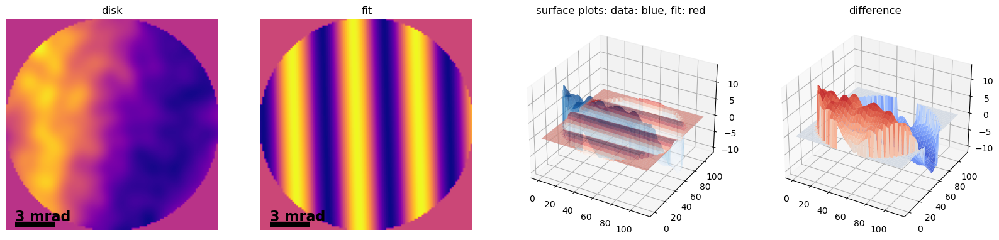

-0.008668931330303664
------ try 2 ------


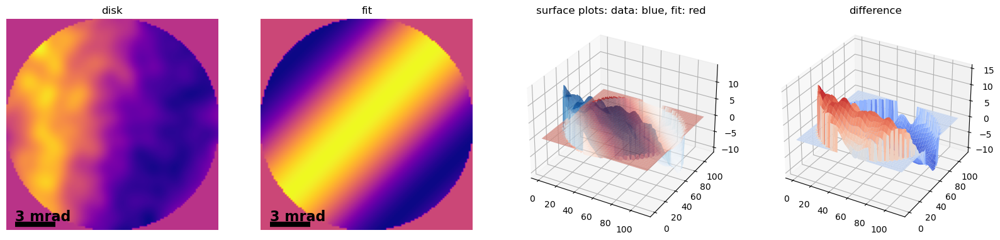

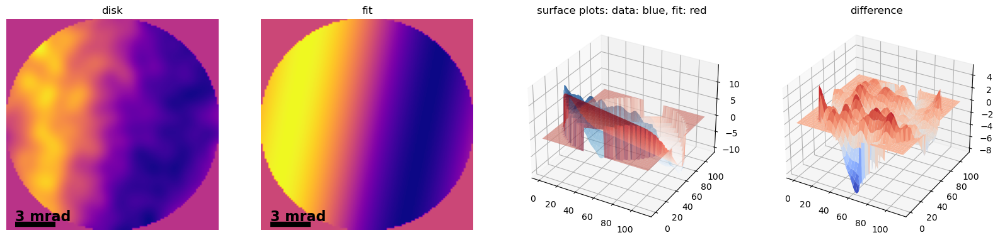

0.9507576177882505
====== disk 4 ======
------ try 1 ------


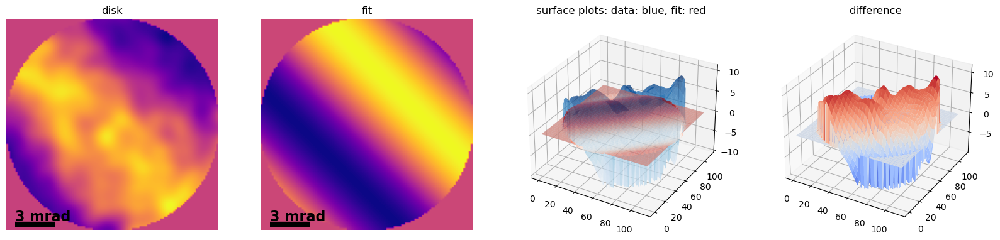

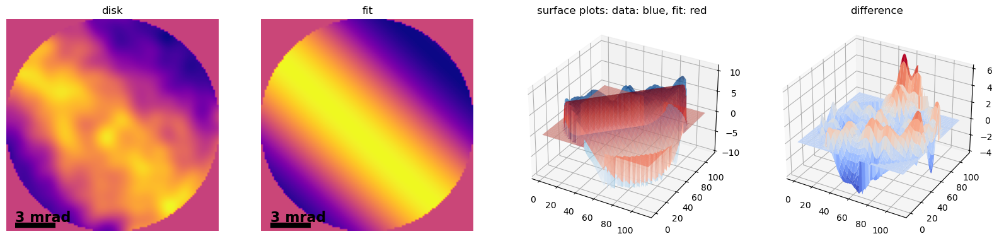

0.9284403928880554
====== disk 5 ======
------ try 1 ------


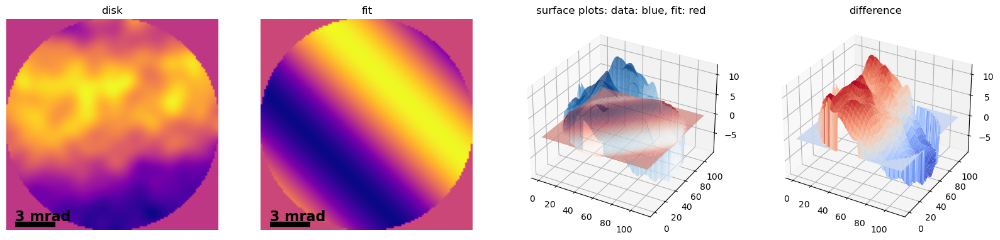

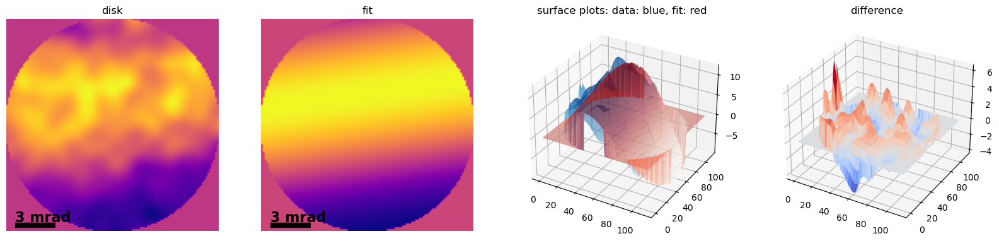

0.9450117109526536


In [42]:
dp = pos01.fit_position([1,1], ps, gaussian=4, rotate_avrg=False, binning=True, save='20230912_files/pos02-final/fits')

In [43]:
dp.get_stats(save='20230912_files/pos02-final/fits')

disk 0

A : -10.083458363031927
phi : 2.861388790631692
nu : 0.005947492534906768
dir_angle : 1.4876432489517868
wl : 0.023459811313815936 rad
r_squared : 0.9692913748142422
dir_error : 0.0014035248649989637


disk 1

A : -8.564012985234017
phi : 1.25097181108312
nu : 0.008058595522469717
dir_angle : -0.7732430597201071
wl : 0.017314065741381293 rad
r_squared : 0.9642908850619685
dir_error : 0.0012516215934599646


disk 2

A : 9.139059543566594
phi : -2.1501227948808546
nu : 0.006764240873806153
dir_angle : 0.19609997139791896
wl : 0.020627156138029644 rad
r_squared : 0.9352730781987211
dir_error : 0.0017009504358513788


disk 3

A : 9.634092912504661
phi : 11.387297679596575
nu : 0.007140014722183436
dir_angle : 1.3712793386459872
wl : 0.01954156372055404 rad
r_squared : 0.9507576177882505
dir_error : 0.001655406233465748


disk 4

A : -7.942590528768619
phi : -3.6383913085541035
nu : 0.008593830571890164
dir_angle : -0.7506201777944361
wl : 0.016235722998266353 rad
r_squared : 0.9284

## analyze map

In [45]:
pos01.verbose = False

In [46]:
defocus_array, defocus_mean, \
    ild_array, ild_mean, rotation_array, \
    A_array, phi_array, lambda_array = pos01.analyze_map(ps, '20230912_files/pos02-final/analysis/', gaussian=4, rotate_avrg=False, binning=True)

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 4901/4901 [1:11:46<00:00,  1.14it/s]


In [68]:
savedir = '20230912_files/pos02-final/analysis/'
savefile = '20230912_files/pos02-final/analysis/fitting_parameters.txt'


d_arrays = []
ild_arrays = []
ild_stds = []
rot_arrays = []
A_arrays = []
phi_arrays = []
lambda_arrays = []

slices = [slice(0,1), slice(1,2), slice(2,3), slice(3,4), slice(4,5), slice(5,6), slice(0,6)]

for i, s in enumerate(slices):
    d_array, d_mean, ild_array, ild_std, ild_mean, rot_array, A_array, phi_array, lam_array = pos01.get_fitted_maps(savefile, 
                                                                                                                    save=savedir, 
                                                                                                                    diskslice=s)
    d_arrays.append(d_array)
    ild_arrays.append(ild_array)
    ild_stds.append(ild_std)
    rot_arrays.append(rot_array)
    A_arrays.append(A_array)
    phi_arrays.append(phi_array)
    lambda_arrays.append(lam_array)
    

/home/clara/miniconda3/envs/mt_analysis/lib/python3.9/site-packages/numpy/core/fromnumeric.py:3504: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/home/clara/miniconda3/envs/mt_analysis/lib/python3.9/site-packages/numpy/core/_methods.py:129: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
/home/clara/miniconda3/envs/mt_analysis/lib/python3.9/site-packages/numpy/core/_methods.py:206: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/home/clara/miniconda3/envs/mt_analysis/lib/python3.9/site-packages/numpy/core/_methods.py:163: RuntimeWarning: invalid value encountered in divide
  arrmean = um.true_divide(arrmean, div, out=arrmean,
/home/clara/miniconda3/envs/mt_analysis/lib/python3.9/site-packages/numpy/core/_methods.py:198: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


In [69]:
def get_array_plots(array, scale, typ, name, unit, shape=(70,70), save=False):
    
    title = typ + ' ' + name
    
    mask = np.where(array>0)
    mean = np.mean([array[i] for i in mask])
    std = np.std([array[i] for i in mask])
    s = f'mean: {float(f"{mean:.4g}"):g}\nstd: {float(f"{std:.4g}"):g}'
    
    fig, axs = hf.make_scalebar(array.reshape(shape), scale, (1,2,2), unit='nm')
    im = axs[1].imshow(array.reshape(shape).transpose(), cmap='plasma')
    cbar = plt.colorbar(im, fraction=0.046, pad=0.04)
    cbar.ax.tick_params(labelsize=12)
    #cbar.get_offset_text().set_fontsize(11)
    
    axs[0].hist(array, 35, density=True, color='teal', edgecolor='navy')
    axs[0].text(0.7, 0.9, s, horizontalalignment='left',verticalalignment='center', transform=axs[0].transAxes)

    
    axs[0].tick_params(labelsize=15)
    axs[0].yaxis.get_offset_text().set_fontsize(13)
    axs[0].xaxis.get_offset_text().set_fontsize(13)
    
    axs[0].set_xlabel(typ + f' ({unit})', fontsize=13)
    
    plt.suptitle(title)
    
    plt.tight_layout()
    
    if save:
        plt.savefig(save,  bbox_inches='tight', pad_inches=0)

/home/clara/miniconda3/envs/mt_analysis/lib/python3.9/site-packages/numpy/core/fromnumeric.py:3504: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/home/clara/miniconda3/envs/mt_analysis/lib/python3.9/site-packages/numpy/core/_methods.py:129: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
/home/clara/miniconda3/envs/mt_analysis/lib/python3.9/site-packages/numpy/core/_methods.py:206: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/home/clara/miniconda3/envs/mt_analysis/lib/python3.9/site-packages/numpy/core/_methods.py:163: RuntimeWarning: invalid value encountered in divide
  arrmean = um.true_divide(arrmean, div, out=arrmean,
/home/clara/miniconda3/envs/mt_analysis/lib/python3.9/site-packages/numpy/core/_methods.py:198: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
/home/clara/minicond

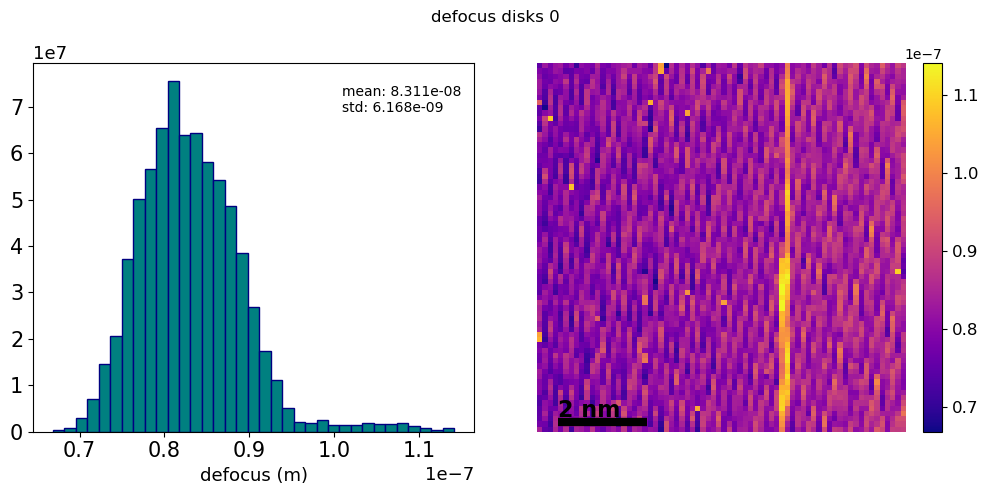

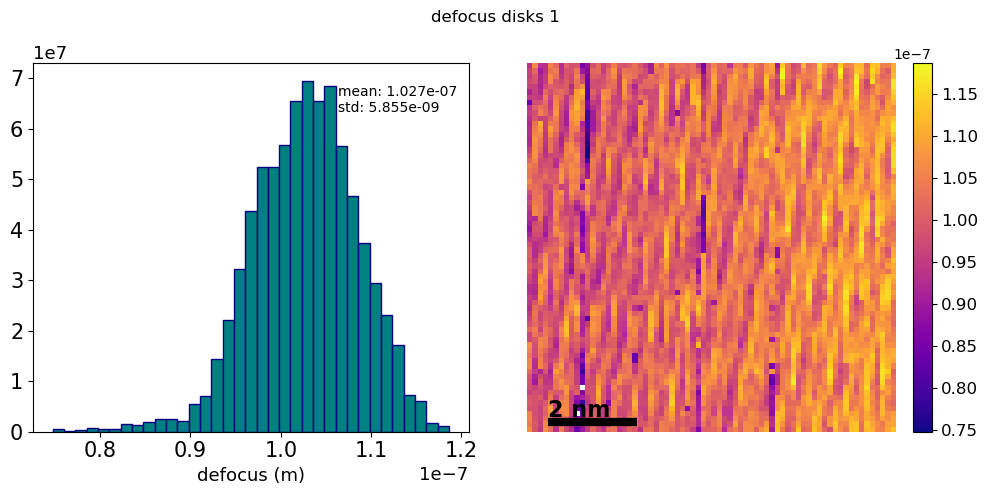

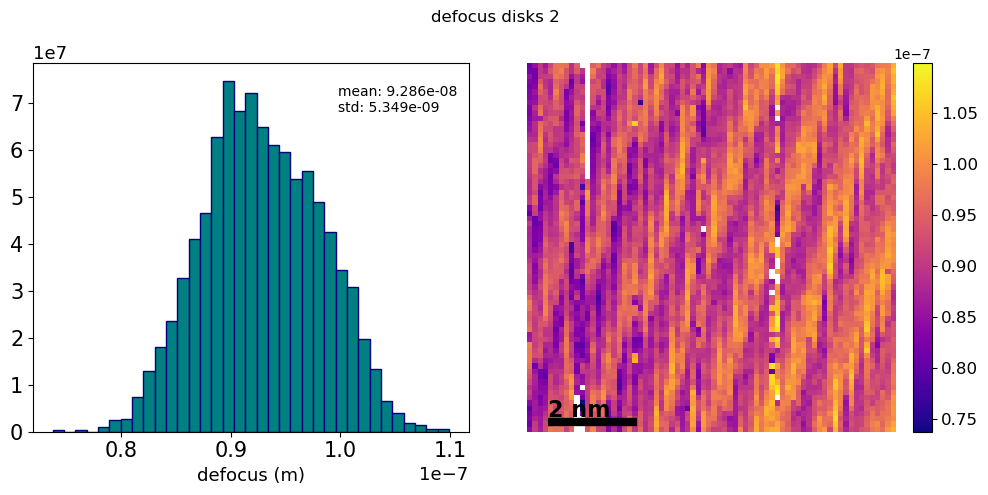

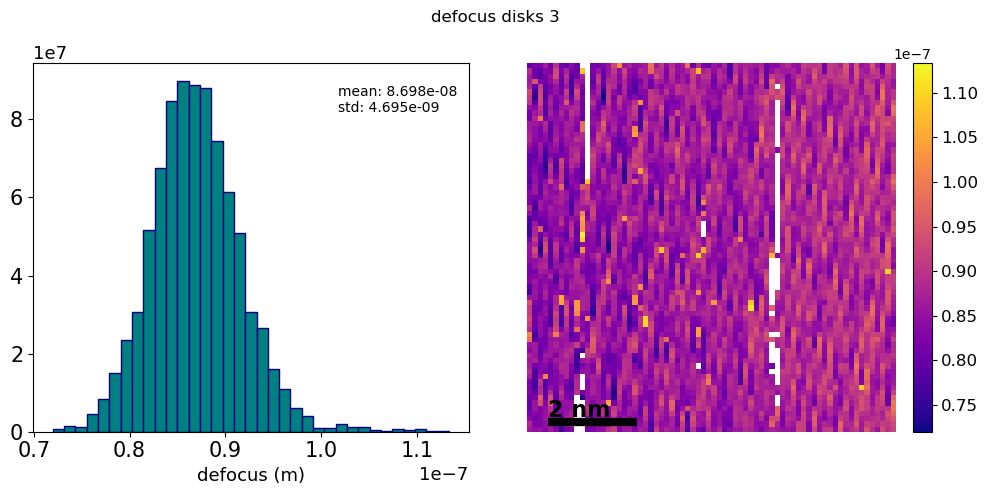

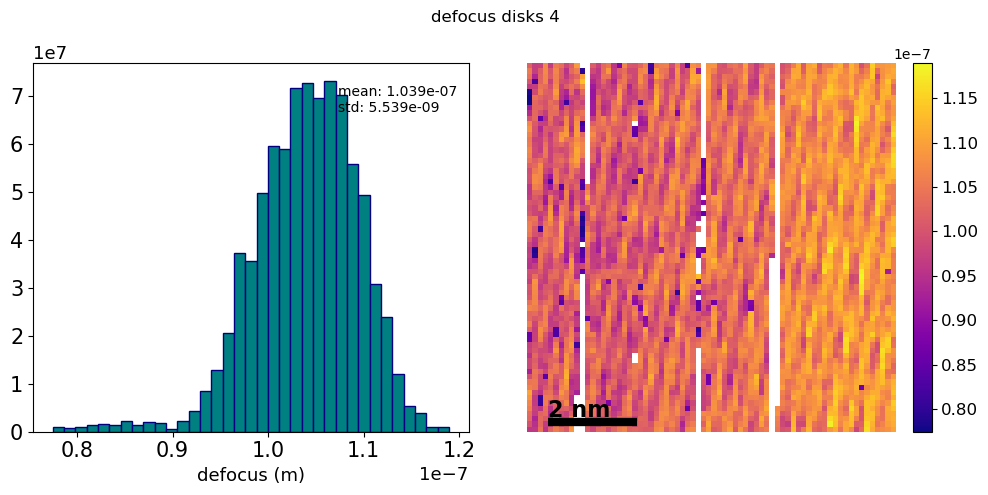

...

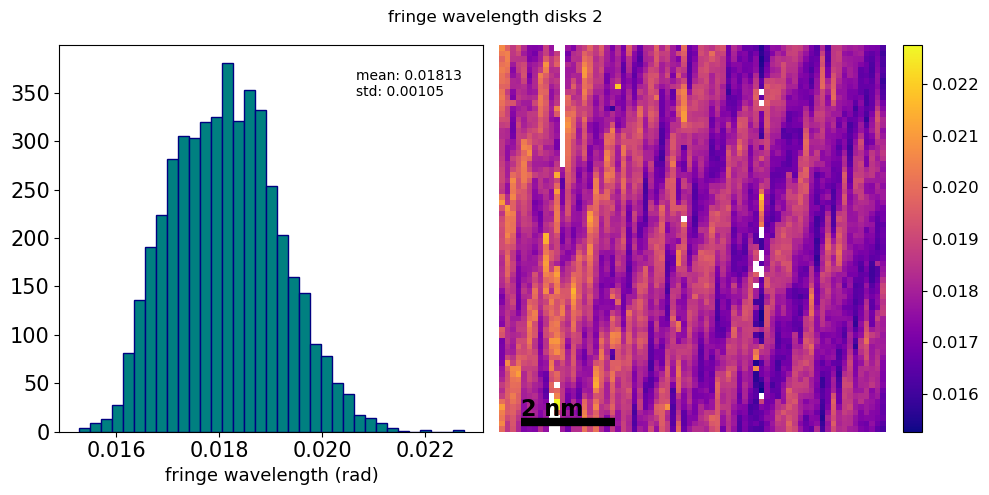

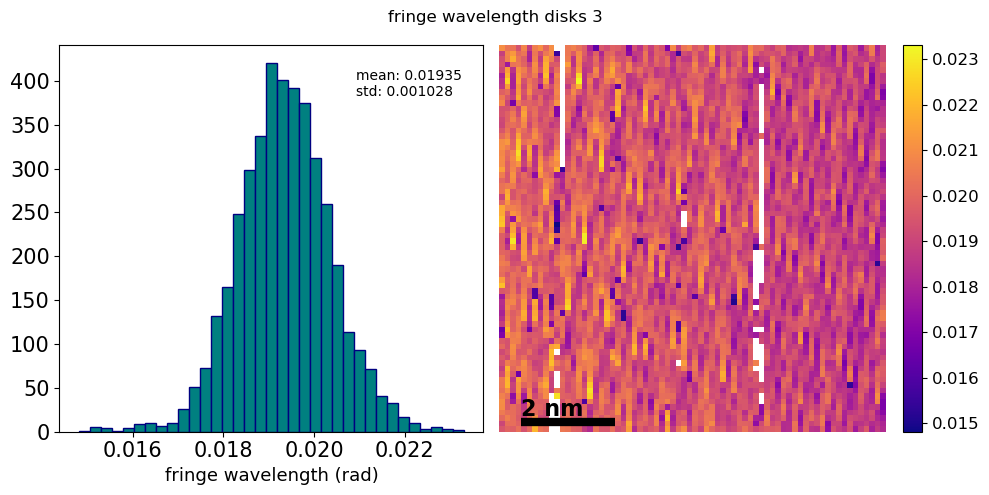

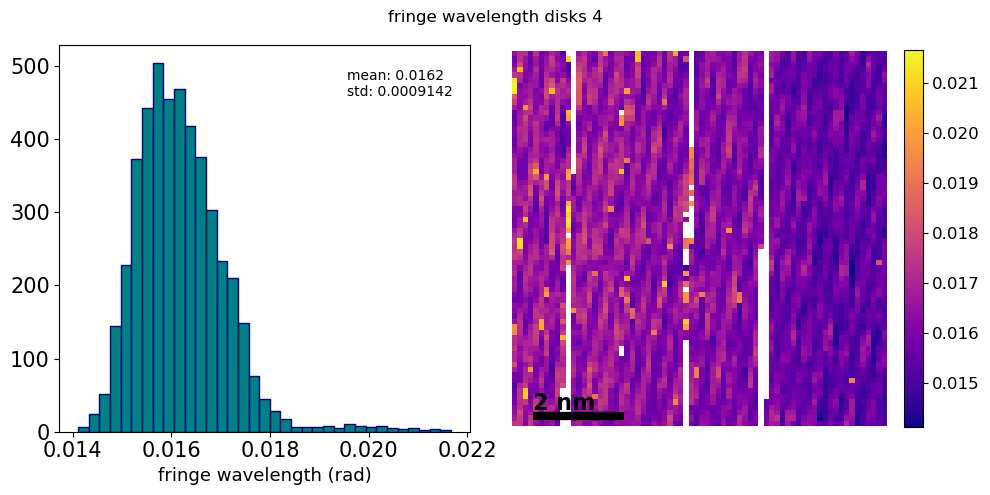

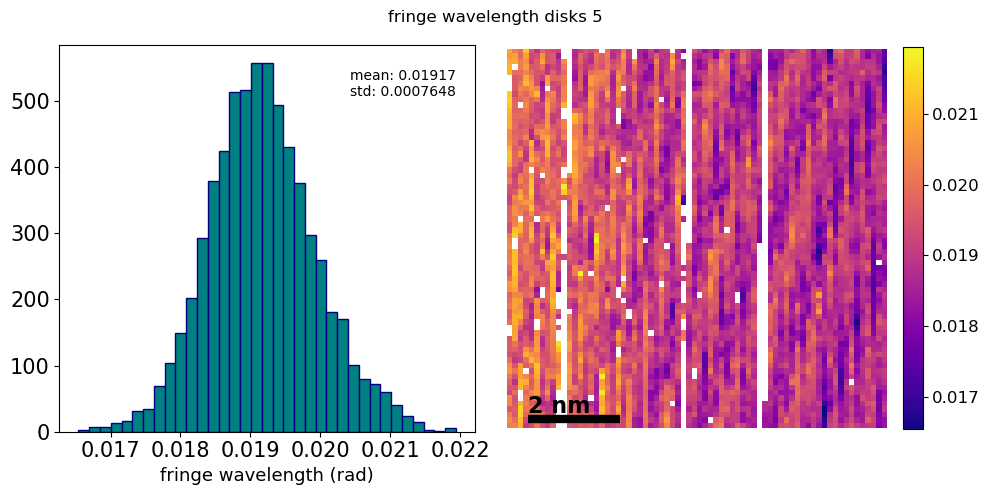

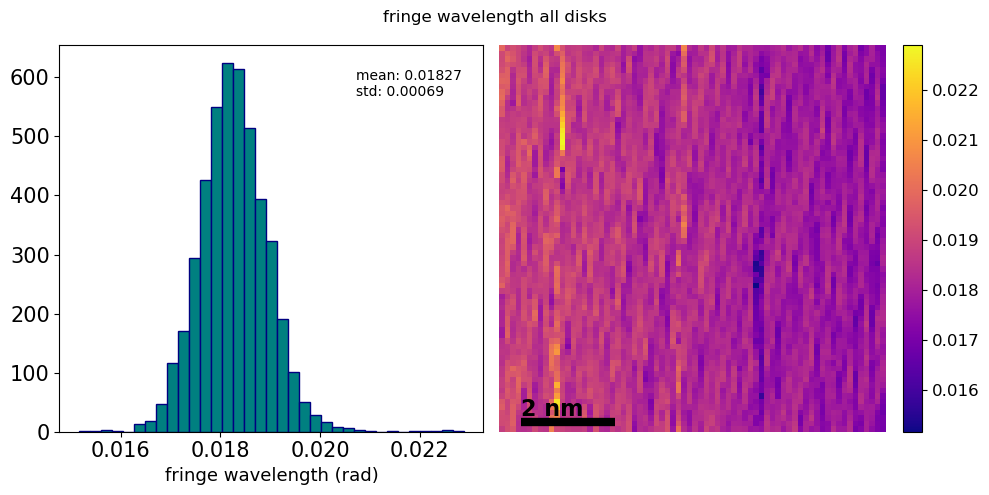

In [71]:
types = ['defocus', 'interlayer distance', 'interlayer distance standard deviation', 'fringe rotation', 'amplitude', 'phase shift', 'fringe wavelength']
names = [f'disks {i}' for i in range(6)] + ['all disks']
units = ['m', 'm', 'm', 'degrees', 'intensity', 'rad', 'rad']

arrays = [d_arrays, ild_arrays, ild_stds, [np.degrees(r) for r in rot_arrays], A_arrays, phi_arrays, lambda_arrays]

path = '20230912_files/pos02-final/analysis/array_plots/'

for i, typ in enumerate(types):
    this_arrays = arrays[i]
    
    for j, array in enumerate(this_arrays):
        save = path+f"{typ.replace(' ', '-')}_{names[j].replace(' ', '-')}_plot.pdf"
        get_array_plots(array.ravel(), pos01.image_scale/(70/len(pos01.real_image)), typ=typ, name=names[j], unit=units[i], save=save)
        
        